# Exploratory Data Analysis - Sports

● To perform ‘Exploratory Data Analysis’ on dataset ‘Indian Premier League’ 
● To find out the most successful teams, players and factors 
contributing win or loss of a team. 


## Step 1: Reading and inspecting Data

In [471]:
#pip install chart_studio

In [1]:
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.offline as pyo
import plotly.graph_objs as go
import plotly.figure_factory as ff
import plotly.subplots as subplots

# Plotly to create interactive graph
import chart_studio.plotly as py
from plotly import tools
from plotly.offline import init_notebook_mode,iplot
init_notebook_mode(connected=False)
from numpy import median
import plotly.figure_factory as ff
import plotly.graph_objs as go
%matplotlib inline


In [3]:
df = pd.read_csv(r'deliveries.csv')

In [4]:
match = pd.read_csv(r'matches.csv')

In [5]:
df.head()

,match_id,inning,batting_team,bowling_team,over,ball,batsman,non_striker,bowler,is_super_over,...,bye_runs,legbye_runs,noball_runs,penalty_runs,batsman_runs,extra_runs,total_runs,player_dismissed,dismissal_kind,fielder
0,1,1,Sunrisers Hyderabad,Royal Challengers Bangalore,1,1,DA Warner,S Dhawan,TS Mills,0,...,0,0,0,0,0,0,0,NaN,NaN,NaN
1,1,1,Sunrisers Hyderabad,Royal Challengers Bangalore,1,2,DA Warner,S Dhawan,TS Mills,0,...,0,0,0,0,0,0,0,NaN,NaN,NaN
2,1,1,Sunrisers Hyderabad,Royal Challengers Bangalore,1,3,DA Warner,S Dhawan,TS Mills,0,...,0,0,0,0,4,0,4,NaN,NaN,NaN
3,1,1,Sunrisers Hyderabad,Royal Challengers Bangalore,1,4,DA Warner,S Dhawan,TS Mills,0,...,0,0,0,0,0,0,0,NaN,NaN,NaN
4,1,1,Sunrisers Hyderabad,Royal Challengers Bangalore,1,5,DA Warner,S Dhawan,TS Mills,0,...,0,0,0,0,0,2,2,NaN,NaN,NaN


In [6]:
df.columns

Index(['match_id', 'inning', 'batting_team', 'bowling_team', 'over', 'ball',
       'batsman', 'non_striker', 'bowler', 'is_super_over', 'wide_runs',
       'bye_runs', 'legbye_runs', 'noball_runs', 'penalty_runs',
       'batsman_runs', 'extra_runs', 'total_runs', 'player_dismissed',
       'dismissal_kind', 'fielder'],
      dtype='object')

In [7]:
df.match_id.value_counts().tail()

120      108
568      106
452      100
301       63
11340     51
Name: match_id, dtype: int64

In [8]:
df.isnull().sum()

match_id                 0
inning                   0
batting_team             0
bowling_team             0
over                     0
ball                     0
batsman                  0
non_striker              0
bowler                   0
is_super_over            0
wide_runs                0
bye_runs                 0
legbye_runs              0
noball_runs              0
penalty_runs             0
batsman_runs             0
extra_runs               0
total_runs               0
player_dismissed    170244
dismissal_kind      170244
fielder             172630
dtype: int64

In [9]:
df.shape

(179078, 21)

In [10]:
match.head()

,id,season,city,date,team1,team2,toss_winner,toss_decision,result,dl_applied,winner,win_by_runs,win_by_wickets,player_of_match,venue,umpire1,umpire2,umpire3
0,1,2017,Hyderabad,2017-04-05,Sunrisers Hyderabad,Royal Challengers Bangalore,Royal Challengers Bangalore,field,normal,0,Sunrisers Hyderabad,35,0,Yuvraj Singh,"Rajiv Gandhi International Stadium, Uppal",AY Dandekar,NJ Llong,NaN
1,2,2017,Pune,2017-04-06,Mumbai Indians,Rising Pune Supergiant,Rising Pune Supergiant,field,normal,0,Rising Pune Supergiant,0,7,SPD Smith,Maharashtra Cricket Association Stadium,A Nand Kishore,S Ravi,NaN
2,3,2017,Rajkot,2017-04-07,Gujarat Lions,Kolkata Knight Riders,Kolkata Knight Riders,field,normal,0,Kolkata Knight Riders,0,10,CA Lynn,Saurashtra Cricket Association Stadium,Nitin Menon,CK Nandan,NaN
3,4,2017,Indore,2017-04-08,Rising Pune Supergiant,Kings XI Punjab,Kings XI Punjab,field,normal,0,Kings XI Punjab,0,6,GJ Maxwell,Holkar Cricket Stadium,AK Chaudhary,C Shamshuddin,NaN
4,5,2017,Bangalore,2017-04-08,Royal Challengers Bangalore,Delhi Daredevils,Royal Challengers Bangalore,bat,normal,0,Royal Challengers Bangalore,15,0,KM Jadhav,M Chinnaswamy Stadium,NaN,NaN,NaN


In [11]:
match.shape

(756, 18)

In [12]:
match.columns

Index(['id', 'season', 'city', 'date', 'team1', 'team2', 'toss_winner',
       'toss_decision', 'result', 'dl_applied', 'winner', 'win_by_runs',
       'win_by_wickets', 'player_of_match', 'venue', 'umpire1', 'umpire2',
       'umpire3'],
      dtype='object')

In [14]:
match.id.value_counts()

11311    1
248      1
257      1
256      1
255      1
        ..
503      1
502      1
501      1
500      1
1        1
Name: id, Length: 756, dtype: int64

In [15]:
df.describe()

,match_id,inning,over,ball,is_super_over,wide_runs,bye_runs,legbye_runs,noball_runs,penalty_runs,batsman_runs,extra_runs,total_runs
count,179078.000000,179078.000000,179078.000000,179078.000000,179078.000000,179078.000000,179078.000000,179078.000000,179078.000000,179078.000000,179078.000000,179078.000000,179078.000000
mean,1802.252957,1.482952,10.162488,3.615587,0.000452,0.036721,0.004936,0.021136,0.004183,0.000056,1.246864,0.067032,1.313897
std,3472.322805,0.502074,5.677684,1.806966,0.021263,0.251161,0.116480,0.194908,0.070492,0.016709,1.608270,0.342553,1.605422
min,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,190.000000,1.000000,5.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,379.000000,1.000000,10.000000,4.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000
75%,567.000000,2.000000,15.000000,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000
max,11415.000000,5.000000,20.000000,9.000000,1.000000,5.000000,4.000000,5.000000,5.000000,5.000000,7.000000,7.000000,10.000000


In [16]:
match.describe()

,id,season,dl_applied,win_by_runs,win_by_wickets
count,756.000000,756.000000,756.000000,756.000000,756.000000
mean,1792.178571,2013.444444,0.025132,13.283069,3.350529
std,3464.478148,3.366895,0.156630,23.471144,3.387963
min,1.000000,2008.000000,0.000000,0.000000,0.000000
25%,189.750000,2011.000000,0.000000,0.000000,0.000000
50%,378.500000,2013.000000,0.000000,0.000000,4.000000
75%,567.250000,2016.000000,0.000000,19.000000,6.000000
max,11415.000000,2019.000000,1.000000,146.000000,10.000000


### Few observations from both the datasets 

#### In the dataset of teams and player-details, there are 21 columns and 179078 rows 
#### In the season and match details, there are 756 columns and 18 rows
#### 75% of the times, the winning is by a margin of 19 runs.
#### 75% of the times, the winning is by a margin of 6 wickets.


### Merging both the datasets

In [17]:
match = match.rename(columns = {"id": "match_id"})

In [18]:
match.columns

Index(['match_id', 'season', 'city', 'date', 'team1', 'team2', 'toss_winner',
       'toss_decision', 'result', 'dl_applied', 'winner', 'win_by_runs',
       'win_by_wickets', 'player_of_match', 'venue', 'umpire1', 'umpire2',
       'umpire3'],
      dtype='object')

In [19]:
data = pd.merge(left=match, right=df, on='match_id', how='right')
data.head()

,match_id,season,city,date,team1,team2,toss_winner,toss_decision,result,dl_applied,...,bye_runs,legbye_runs,noball_runs,penalty_runs,batsman_runs,extra_runs,total_runs,player_dismissed,dismissal_kind,fielder
0,1,2017,Hyderabad,2017-04-05,Sunrisers Hyderabad,Royal Challengers Bangalore,Royal Challengers Bangalore,field,normal,0,...,0,0,0,0,0,0,0,NaN,NaN,NaN
1,1,2017,Hyderabad,2017-04-05,Sunrisers Hyderabad,Royal Challengers Bangalore,Royal Challengers Bangalore,field,normal,0,...,0,0,0,0,0,0,0,NaN,NaN,NaN
2,1,2017,Hyderabad,2017-04-05,Sunrisers Hyderabad,Royal Challengers Bangalore,Royal Challengers Bangalore,field,normal,0,...,0,0,0,0,4,0,4,NaN,NaN,NaN
3,1,2017,Hyderabad,2017-04-05,Sunrisers Hyderabad,Royal Challengers Bangalore,Royal Challengers Bangalore,field,normal,0,...,0,0,0,0,0,0,0,NaN,NaN,NaN
4,1,2017,Hyderabad,2017-04-05,Sunrisers Hyderabad,Royal Challengers Bangalore,Royal Challengers Bangalore,field,normal,0,...,0,0,0,0,0,2,2,NaN,NaN,NaN


In [20]:
data.shape

(179078, 38)

In [21]:
data['date'] = pd.to_datetime(data['date'])
data['year'] = pd.DatetimeIndex(data['date']).year

In [22]:
data.head()

,match_id,season,city,date,team1,team2,toss_winner,toss_decision,result,dl_applied,...,legbye_runs,noball_runs,penalty_runs,batsman_runs,extra_runs,total_runs,player_dismissed,dismissal_kind,fielder,year
0,1,2017,Hyderabad,2017-04-05,Sunrisers Hyderabad,Royal Challengers Bangalore,Royal Challengers Bangalore,field,normal,0,...,0,0,0,0,0,0,NaN,NaN,NaN,2017
1,1,2017,Hyderabad,2017-04-05,Sunrisers Hyderabad,Royal Challengers Bangalore,Royal Challengers Bangalore,field,normal,0,...,0,0,0,0,0,0,NaN,NaN,NaN,2017
2,1,2017,Hyderabad,2017-04-05,Sunrisers Hyderabad,Royal Challengers Bangalore,Royal Challengers Bangalore,field,normal,0,...,0,0,0,4,0,4,NaN,NaN,NaN,2017
3,1,2017,Hyderabad,2017-04-05,Sunrisers Hyderabad,Royal Challengers Bangalore,Royal Challengers Bangalore,field,normal,0,...,0,0,0,0,0,0,NaN,NaN,NaN,2017
4,1,2017,Hyderabad,2017-04-05,Sunrisers Hyderabad,Royal Challengers Bangalore,Royal Challengers Bangalore,field,normal,0,...,0,0,0,0,2,2,NaN,NaN,NaN,2017


In [23]:
data.columns

Index(['match_id', 'season', 'city', 'date', 'team1', 'team2', 'toss_winner',
       'toss_decision', 'result', 'dl_applied', 'winner', 'win_by_runs',
       'win_by_wickets', 'player_of_match', 'venue', 'umpire1', 'umpire2',
       'umpire3', 'inning', 'batting_team', 'bowling_team', 'over', 'ball',
       'batsman', 'non_striker', 'bowler', 'is_super_over', 'wide_runs',
       'bye_runs', 'legbye_runs', 'noball_runs', 'penalty_runs',
       'batsman_runs', 'extra_runs', 'total_runs', 'player_dismissed',
       'dismissal_kind', 'fielder', 'year'],
      dtype='object')

In [24]:
data.player_dismissed

0               NaN
1               NaN
2               NaN
3               NaN
4               NaN
            ...    
179073          NaN
179074          NaN
179075    SR Watson
179076          NaN
179077    SN Thakur
Name: player_dismissed, Length: 179078, dtype: object

In [25]:
data.season.value_counts()

2013    18177
2012    17767
2011    17013
2010    14498
2019    14328
2014    14300
2018    14290
2016    14096
2017    13862
2015    13652
2009    13606
2008    13489
Name: season, dtype: int64

In [26]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 179078 entries, 0 to 179077
Data columns (total 39 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   match_id          179078 non-null  int64         
 1   season            179078 non-null  int64         
 2   city              177378 non-null  object        
 3   date              179078 non-null  datetime64[ns]
 4   team1             179078 non-null  object        
 5   team2             179078 non-null  object        
 6   toss_winner       179078 non-null  object        
 7   toss_decision     179078 non-null  object        
 8   result            179078 non-null  object        
 9   dl_applied        179078 non-null  int64         
 10  winner            178706 non-null  object        
 11  win_by_runs       179078 non-null  int64         
 12  win_by_wickets    179078 non-null  int64         
 13  player_of_match   178706 non-null  object        
 14  venu

In [27]:
for col in data:
    print(data[col].unique())

[    1     2     3     4     5     6     7     8     9    10    11    12
    13    14    15    16    17    18    19    20    21    22    23    24
    25    26    27    28    29    30    31    32    33    34    35    36
    37    38    39    40    41    42    43    44    45    46    47    48
    49    50    51    52    53    54    55    56    57    58    59    60
    61    62    63    64    65    66    67    68    69    70    71    72
    73    74    75    76    77    78    79    80    81    82    83    84
    85    86    87    88    89    90    91    92    93    94    95    96
    97    98    99   100   101   102   103   104   105   106   107   108
   109   110   111   112   113   114   115   116   117   118   119   120
   121   122   123   124   125   126   127   128   129   130   131   132
   133   134   135   136   137   138   139   140   141   142   143   144
   145   146   147   148   149   150   151   152   153   154   155   156
   157   158   159   160   161   162   163   164   

 'IS Bindra Stadium' 'ACA-VDCA Stadium']
['AY Dandekar' 'A Nand Kishore' 'Nitin Menon' 'AK Chaudhary' nan
 'A Deshmukh' 'KN Ananthapadmanabhan' 'YC Barde' 'S Ravi' 'CB Gaffaney'
 'M Erasmus' 'NJ Llong' 'CK Nandan' 'Asad Rauf' 'MR Benson' 'Aleem Dar'
 'SJ Davis' 'BF Bowden' 'IL Howell' 'DJ Harper' 'RE Koertzen'
 'BR Doctrove' 'AV Jayaprakash' 'BG Jerling' 'HDPK Dharmasena' 'S Asnani'
 'GAV Baxter' 'SS Hazare' 'K Hariharan' 'SL Shastri' 'SK Tarapore'
 'SJA Taufel' 'S Das' 'AM Saheba' 'PR Reiffel' 'JD Cloete' 'VA Kulkarni'
 'BNJ Oxenford' 'C Shamshuddin' 'RK Illingworth' 'RM Deshpande'
 'K Srinath' 'SD Fry' 'PG Pathak' 'K Bharatan' 'Chris Gaffaney'
 'Rod Tucker' 'Nigel Llong' 'Anil Chaudhary' 'K Ananthapadmanabhan'
 'O Nandan' 'A Nanda Kishore' 'Vineet Kulkarni' 'Bruce Oxenford'
 'Marais Erasmus' 'Kumar Dharmasena' 'Anil Dandekar' 'Yeshwant Barde'
 'Ian Gould' 'Ulhas Gandhe' 'Nanda Kishore' 'Sundaram Ravi']
['NJ Llong' 'S Ravi' 'CK Nandan' 'C Shamshuddin' nan 'AK Chaudhary'
 'Nitin Menon'

[2017 2008 2009 2010 2011 2012 2013 2014 2015 2016 2018 2019]


## Step 2: Data Cleaning and EDA

In [28]:
data.isnull().sum()*100/len(data)

match_id             0.000000
season               0.000000
city                 0.949307
date                 0.000000
team1                0.000000
team2                0.000000
toss_winner          0.000000
toss_decision        0.000000
result               0.000000
dl_applied           0.000000
winner               0.207731
win_by_runs          0.000000
win_by_wickets       0.000000
player_of_match      0.207731
venue                0.000000
umpire1              0.279208
umpire2              0.279208
umpire3             84.159975
inning               0.000000
batting_team         0.000000
bowling_team         0.000000
over                 0.000000
ball                 0.000000
batsman              0.000000
non_striker          0.000000
bowler               0.000000
is_super_over        0.000000
wide_runs            0.000000
bye_runs             0.000000
legbye_runs          0.000000
noball_runs          0.000000
penalty_runs         0.000000
batsman_runs         0.000000
extra_runs

In [29]:
data = data.drop(['umpire3'],axis=1)

In [30]:
data.shape

(179078, 38)

### Univariate Analysis

In [31]:
# Let's check individual variables statistics
cat_cols_1 = data[['batting_team', 'bowling_team', 'dismissal_kind']]

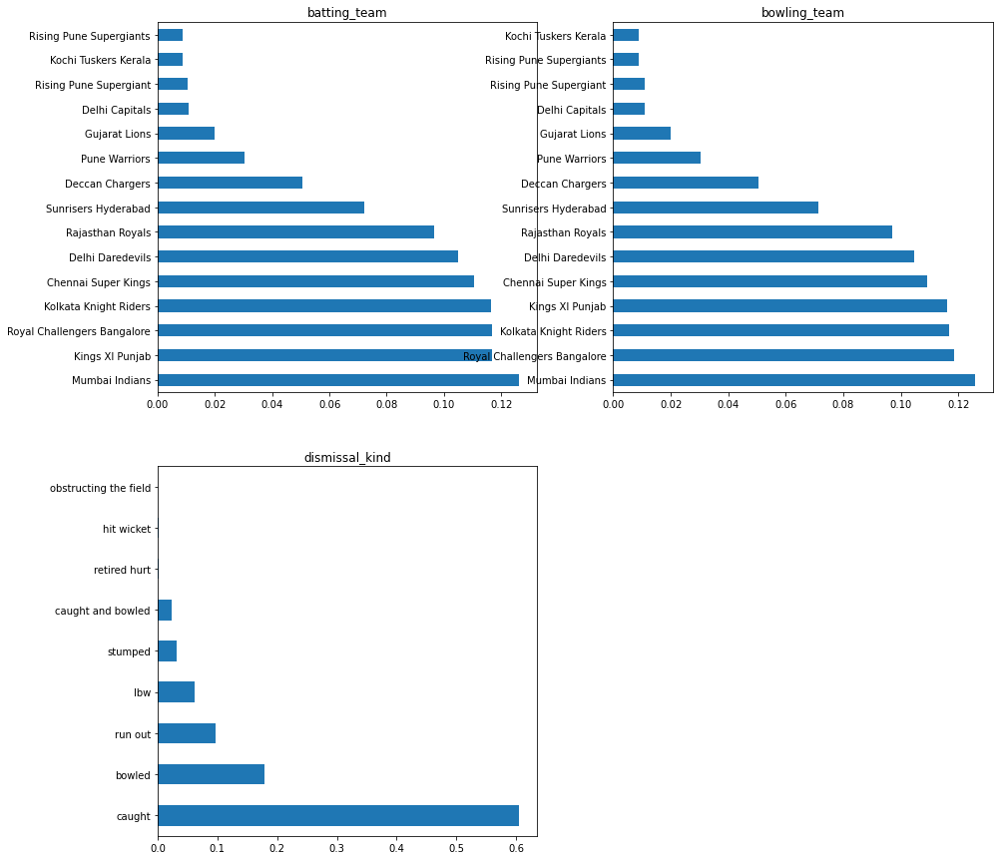

In [32]:
plt.figure(figsize = [15,15])
for ind, col in enumerate(cat_cols_1):
    plt.subplot(2,2,ind+1)
    df[col].value_counts(normalize=True).plot.barh()
    plt.title(col)
plt.show()

In [33]:
cat_cols_2 = data[['batsman', 'non_striker', 'bowler', 'player_dismissed',
       'fielder']]

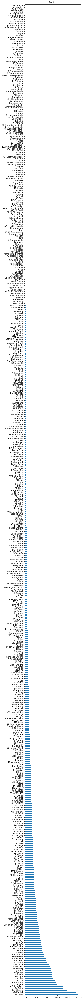

In [34]:
plt.figure(figsize = [5,90])
df['fielder'].value_counts(normalize=True).plot.barh()
plt.title('fielder')
plt.show()

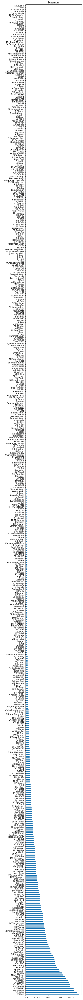

In [35]:
plt.figure(figsize = [5,90])
df['batsman'].value_counts(normalize=True).plot.barh()
plt.title('batsman')
plt.show()

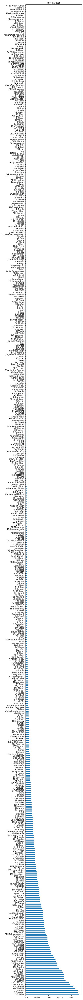

In [37]:
plt.figure(figsize = [5,90])
df['non_striker'].value_counts(normalize=True).plot.barh()
plt.title('non_striker')
plt.show()

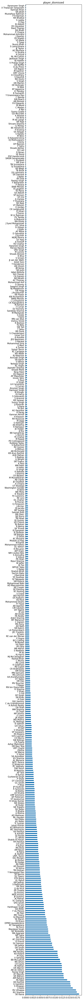

In [38]:
plt.figure(figsize = [5,90])
df['player_dismissed'].value_counts(normalize=True).plot.barh()
plt.title('player_dismissed')
plt.show()

In [39]:
cat_cols3 = data[['team1','team2','toss_winner','toss_decision','result']]

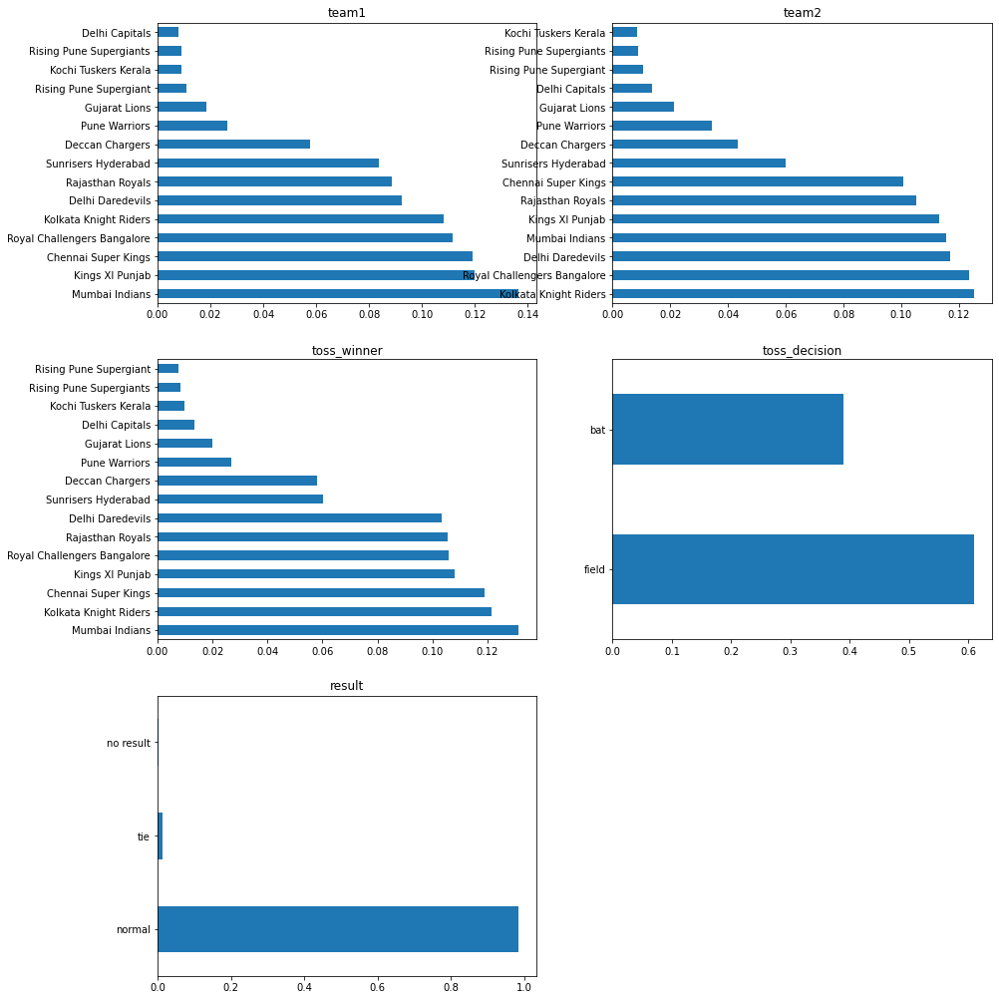

In [40]:
plt.figure(figsize = [15,30])
for ind, col in enumerate(cat_cols3):
    plt.subplot(5,2,ind+1)
    data[col].value_counts(normalize=True).plot.barh()
    plt.title(col)
plt.show()

In [41]:
cat_cols4 = data[['team2','venue']]

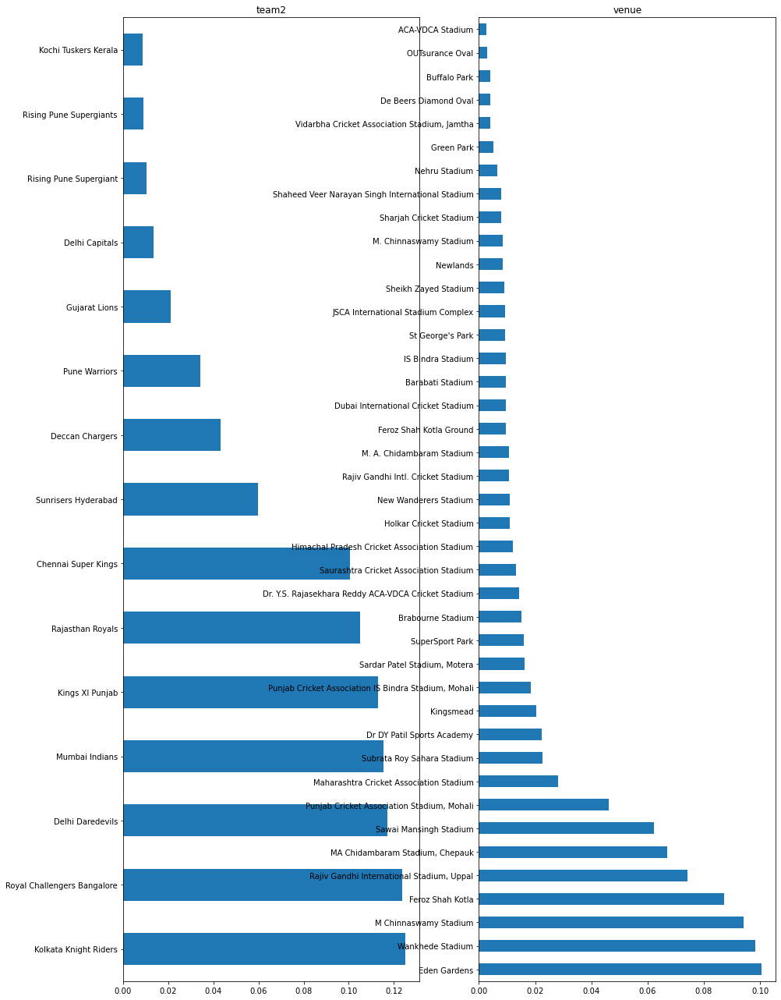

In [42]:
plt.figure(figsize = [15,50])
for ind, col in enumerate(cat_cols4):
    plt.subplot(2,2,ind+1)
    data[col].value_counts(normalize=True).plot.barh()
    plt.title(col)
plt.show()

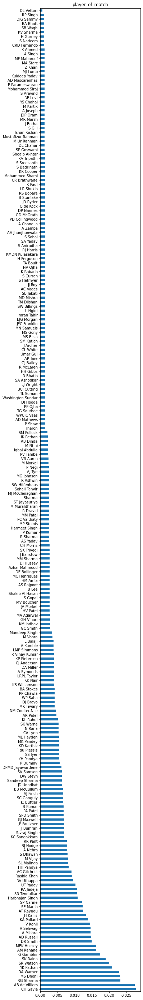

In [43]:
plt.figure(figsize = [5,50])
data['player_of_match'].value_counts(normalize=True).plot.barh()
plt.title('player_of_match')
plt.show()

In [44]:
BM = data.groupby(['penalty_runs','batsman','batsman_runs','batting_team'],as_index=False).agg({"total_runs": "sum"}).sort_values(['total_runs'], ascending=[False])

In [45]:
BM

,penalty_runs,batsman,batsman_runs,batting_team,total_runs
3875,0,V Kohli,4,Royal Challengers Bangalore,1928
3872,0,V Kohli,1,Royal Challengers Bangalore,1762
3454,0,SK Raina,4,Chennai Super Kings,1665
762,0,CH Gayle,6,Royal Challengers Bangalore,1445
3448,0,SK Raina,1,Chennai Super Kings,1439
...,...,...,...,...,...
1900,0,L Balaji,0,Kolkata Knight Riders,0
1899,0,L Balaji,0,Kings XI Punjab,0
3765,0,TA Boult,0,Kolkata Knight Riders,0
3764,0,TA Boult,0,Delhi Daredevils,0


In [46]:
Match_season = data.groupby(['toss_winner','winner','win_by_runs','win_by_wickets','player_of_match'],as_index=False).agg({"season": "sum"}).sort_values(['season'], ascending=[False])

In [47]:
Match_season

,toss_winner,winner,win_by_runs,win_by_wickets,player_of_match,season
447,Mumbai Indians,Mumbai Indians,0,6,RG Sharma,1443456
250,Kings XI Punjab,Kings XI Punjab,0,6,KL Rahul,1443347
351,Kolkata Knight Riders,Kolkata Knight Riders,0,6,SP Narine,1393027
40,Chennai Super Kings,Chennai Super Kings,24,0,SK Raina,1008230
578,Rajasthan Royals,Rajasthan Royals,2,0,SK Warne,1004749
...,...,...,...,...,...,...
624,Royal Challengers Bangalore,Kings XI Punjab,22,0,AR Patel,253890
183,Delhi Daredevils,Kings XI Punjab,6,0,DPMD Jayawardene,246984
167,Delhi Daredevils,Delhi Daredevils,0,10,DL Vettori,216972
703,Sunrisers Hyderabad,Royal Challengers Bangalore,0,6,V Kohli,213590


In [48]:
#Lets further analyse the winners 
teams_per_season = data.groupby('season')['winner'].value_counts()
teams_per_season

season  winner                     
2008    Rajasthan Royals               3094
        Kings XI Punjab                2303
        Chennai Super Kings            2127
        Delhi Daredevils               1641
        Mumbai Indians                 1509
                                       ... 
2019    Kings XI Punjab                1466
        Kolkata Knight Riders          1431
        Sunrisers Hyderabad            1426
        Royal Challengers Bangalore    1236
        Rajasthan Royals               1216
Name: winner, Length: 100, dtype: int64

In [49]:
# Lets check which team had won by maximum runs
# the below code will return the id of the maximumth value which in turn is fed into iloc that takes an index value 
# and returns the row. 
data.iloc[data['win_by_runs'].idxmax()]              

match_id                             44
season                             2017
city                              Delhi
date                2017-05-06 00:00:00
team1                    Mumbai Indians
team2                  Delhi Daredevils
toss_winner            Delhi Daredevils
toss_decision                     field
result                           normal
dl_applied                            0
winner                   Mumbai Indians
win_by_runs                         146
win_by_wickets                        0
player_of_match             LMP Simmons
venue                  Feroz Shah Kotla
umpire1                     Nitin Menon
umpire2                       CK Nandan
inning                                1
batting_team             Mumbai Indians
bowling_team           Delhi Daredevils
over                                  1
ball                                  1
batsman                     LMP Simmons
non_striker                    PA Patel
bowler                           Z Khan


In [50]:
data.iloc[data['win_by_runs'].idxmax()]['winner']

'Mumbai Indians'

In [51]:
# which team had won by maximum wickets
data.iloc[data['win_by_wickets'].idxmax()]['winner']

'Kolkata Knight Riders'

In [52]:
data.iloc[data['win_by_wickets'].idxmax()]

match_id                                                 3
season                                                2017
city                                                Rajkot
date                                   2017-04-07 00:00:00
team1                                        Gujarat Lions
team2                                Kolkata Knight Riders
toss_winner                          Kolkata Knight Riders
toss_decision                                        field
result                                              normal
dl_applied                                               0
winner                               Kolkata Knight Riders
win_by_runs                                              0
win_by_wickets                                          10
player_of_match                                    CA Lynn
venue               Saurashtra Cricket Association Stadium
umpire1                                        Nitin Menon
umpire2                                          CK Nand

In [53]:
# lets check which team had won by (closest margin) minimum runs
data.iloc[data[data['win_by_runs'].ge(1)].win_by_runs.idxmin()]['winner']

'Mumbai Indians'

In [54]:
# lets check which team had won by minimum wickets
data.iloc[data[data['win_by_wickets'].ge(1)].win_by_wickets.idxmin()]

match_id                              560
season                               2015
city                              Kolkata
date                  2015-05-09 00:00:00
team1                     Kings XI Punjab
team2               Kolkata Knight Riders
toss_winner               Kings XI Punjab
toss_decision                         bat
result                             normal
dl_applied                              0
winner              Kolkata Knight Riders
win_by_runs                             0
win_by_wickets                          1
player_of_match                AD Russell
venue                        Eden Gardens
umpire1                      AK Chaudhary
umpire2                   HDPK Dharmasena
inning                                  1
batting_team              Kings XI Punjab
bowling_team        Kolkata Knight Riders
over                                    1
ball                                    1
batsman                           M Vijay
non_striker                       

In [55]:
data.iloc[data[data['win_by_wickets'].ge(1)].win_by_wickets.idxmin()]['winner']

'Kolkata Knight Riders'

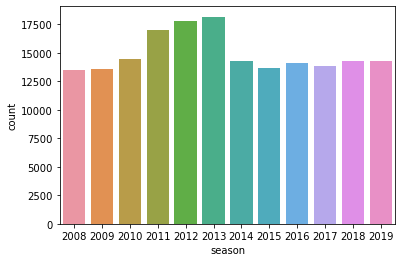

In [56]:
# most number of matches
sns.countplot(x='season', data = data)
plt.show()

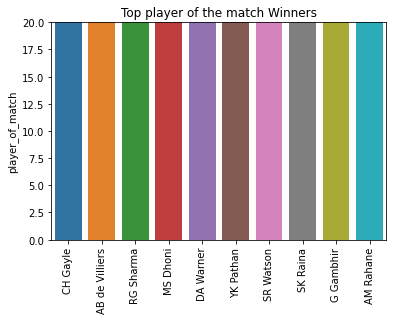

In [57]:
# Lets check the top players of the matches
top_players = data.player_of_match.value_counts()[:10]
fig, ax = plt.subplots()
ax.set_ylim([0,20])
ax.set_ylabel("Count")
ax.set_title("Top player of the match Winners")
top_players.plot.bar()
sns.barplot(x = top_players.index, y = top_players, orient='v'); 
plt.show()

In [58]:
tosswin_win = data[data['toss_winner']==data['winner']]


In [59]:
tosswin_win.shape

(92914, 38)

In [60]:
data['winner'].shape

(179078,)

In [61]:
393/756

0.5198412698412699

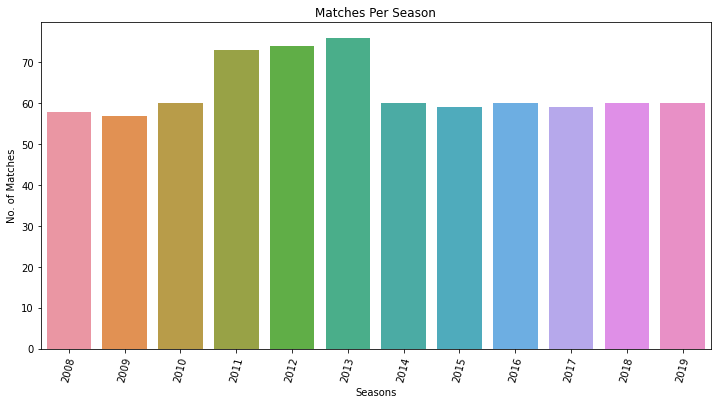

In [62]:
matches_per_season = match.groupby('season').match_id.count()
plt.figure(figsize=(12,6))
plt.xticks(rotation=75)
plt.title('Matches Per Season')
match_per_season_plot = sns.barplot(x = matches_per_season.index, y = matches_per_season)
match_per_season_plot.set(xlabel = 'Seasons', ylabel = 'No. of Matches');

In [63]:
toss_decision_percentage = match.groupby('season').toss_decision.value_counts().sort_index() / matches_per_season * 100

In [64]:
toss_decision_percentage.unstack()

toss_decision,bat,field
season,,
2008,44.827586,55.172414
2009,61.403509,38.596491
2010,65.000000,35.000000
2011,34.246575,65.753425
2012,50.000000,50.000000
2013,59.210526,40.789474
2014,31.666667,68.333333
2015,42.372881,57.627119
2016,18.333333,81.666667


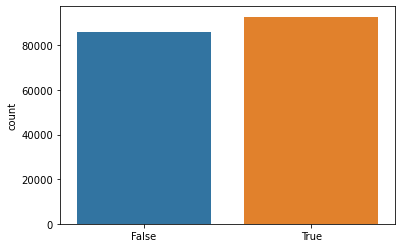

In [65]:
#Lets visualize the plot
sns.countplot(data['toss_winner'] == data['winner'])

In [66]:
year = 2008
win_per_season_df = pd.DataFrame(columns=['year', 'team', 'wins'])
for items in teams_per_season.iteritems():    
    if items[0][0]==year:
        print(items)
        win_series = pd.DataFrame({
            'year': [items[0][0]],
            'team': [items[0][1]],
            'wins': [items[1]]
        })
        win_per_season_df = win_per_season_df.append(win_series)
        year += 1  

((2008, 'Rajasthan Royals'), 3094)
((2009, 'Delhi Daredevils'), 2305)
((2010, 'Mumbai Indians'), 2704)
((2011, 'Chennai Super Kings'), 2702)
((2012, 'Kolkata Knight Riders'), 2938)
((2013, 'Mumbai Indians'), 3173)
((2014, 'Kings XI Punjab'), 2909)
((2015, 'Mumbai Indians'), 2457)
((2016, 'Sunrisers Hyderabad'), 2623)
((2017, 'Mumbai Indians'), 2888)
((2018, 'Chennai Super Kings'), 2697)
((2019, 'Mumbai Indians'), 2671)


In [67]:
win_per_season_df

,year,team,wins
0,2008,Rajasthan Royals,3094
0,2009,Delhi Daredevils,2305
0,2010,Mumbai Indians,2704
0,2011,Chennai Super Kings,2702
0,2012,Kolkata Knight Riders,2938
0,2013,Mumbai Indians,3173
0,2014,Kings XI Punjab,2909
0,2015,Mumbai Indians,2457
0,2016,Sunrisers Hyderabad,2623
0,2017,Mumbai Indians,2888


In [68]:
venue_per_match = data['venue'].value_counts()

In [69]:
venue_df = pd.DataFrame(columns=['venue', 'matches'])
for items in venue_per_match.iteritems():    
    temp_venue = pd.DataFrame({
            'venue': [items[0]],
            'matches': [items[1]]
    })
    venue_df = venue_df.append(temp_venue, ignore_index= True)

In [70]:
venue_df

,venue,matches
0,Eden Gardens,17991
1,Wankhede Stadium,17590
2,M Chinnaswamy Stadium,16872
3,Feroz Shah Kotla,15604
4,"Rajiv Gandhi International Stadium, Uppal",13303
5,"MA Chidambaram Stadium, Chepauk",12006
6,Sawai Mansingh Stadium,11158
7,"Punjab Cricket Association Stadium, Mohali",8266
8,Maharashtra Cricket Association Stadium,5055
9,Subrata Roy Sahara Stadium,4064


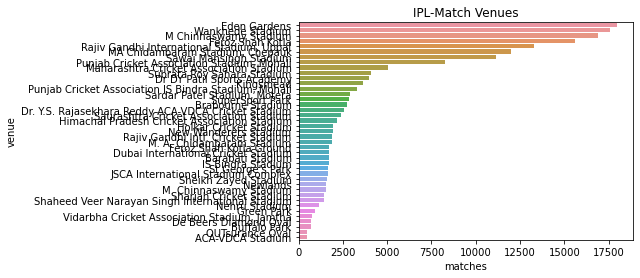

In [71]:
# lets visualize this
plt.title("IPL-Match Venues")
sns.barplot(x='matches', y='venue', data=venue_df)

In [72]:

ipm1=match.groupby(by='winner').sum()[['win_by_runs','win_by_wickets']]

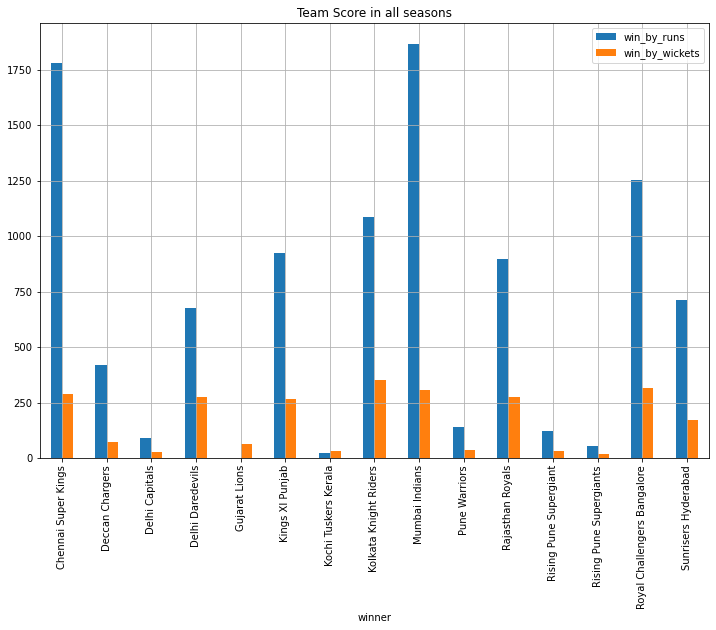

In [73]:
ipm1.plot(kind='bar',figsize=(12,8),grid=True,title='Team Score in all seasons')

In [74]:
venue_matches= data.groupby('venue').count()[['match_id']].sort_values(by='match_id',ascending=False).head()
ser = pd.Series(venue_matches['match_id']) 
venue_matches= data.groupby('venue').count()[['match_id']].reset_index()

data_new = [{"y": venue_matches['match_id'],"x": venue_matches['venue'], 
          "marker": {"color": "lightblue", "size": 12},
         "line": {"color": "red","width" : 2,"dash" : 'dash'},
          "mode": "markers+lines", "name": "Women", "type": "scatter"}]

layout = {"title": "Stadiums Vs. Matches", 
          "xaxis": {"title": "Matches Played", }, 
          "yaxis": {"title": "Stadiums"},
          "autosize":False,"width":900,"height":700,"plot_bgcolor":"rgb(245,245,245)"}

fig = go.Figure(data=data_new, layout=layout)
iplot(fig)

In [75]:
team_winners = data['winner'].value_counts()
team_winners.head()

Mumbai Indians                 26305
Chennai Super Kings            24087
Kolkata Knight Riders          21644
Royal Challengers Bangalore    19553
Kings XI Punjab                19469
Name: winner, dtype: int64

In [76]:
team_wins_df = pd.DataFrame(columns=['team', 'wins'])
for items in team_winners.iteritems():    
    temp_wins = pd.DataFrame({
            'team': [items[0]],
            'wins': [items[1]]
    })
    team_wins_df = team_wins_df.append(temp_wins, ignore_index= True)

In [77]:
team_wins_df

,team,wins
0,Mumbai Indians,26305
1,Chennai Super Kings,24087
2,Kolkata Knight Riders,21644
3,Royal Challengers Bangalore,19553
4,Kings XI Punjab,19469
5,Rajasthan Royals,17948
6,Delhi Daredevils,15709
7,Sunrisers Hyderabad,13786
8,Deccan Chargers,7013
9,Gujarat Lions,3063


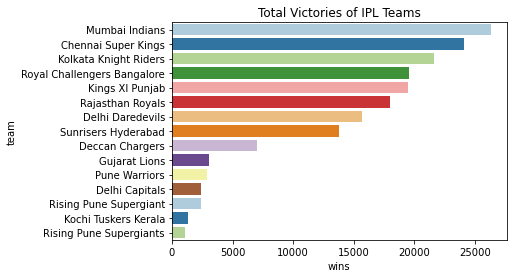

In [78]:
# Lets visualize the team_wins plot
plt.title("Total Victories of IPL Teams")
sns.barplot(x='wins', y='team', data=team_wins_df, palette='Paired')

In [79]:
matches_played=pd.concat([data['team1'],data['team2']])
matches_played=matches_played.value_counts().reset_index()
matches_played.columns=['Team','Total Matches']
matches_played['wins']=data['winner'].value_counts().reset_index()['winner']

matches_played.set_index('Team',inplace=True)
totm = matches_played.reset_index().head(8)

trace = go.Table(
    header=dict(values=["Team","Total Matches","Wins"],
                fill = dict(color='#ff96ea'),
                font = dict(color=['rgb(45, 45, 45)'] * 5, size=14),
                align = ['center'],
               height = 30),
    cells=dict(values=[totm['Team'], totm['Total Matches'], totm['wins']],
               fill = dict(color=['rgb(235, 193, 238)', 'rgba(228, 222, 249, 0.65)']),
               align = ['center'], font_size=13, height=25))

layout = dict(
    width=750,
    height=420,
    autosize=False,
    title='Total Matches vs Wins per team',
    margin = dict(t=100),
    showlegend=False,    
)

fig1 = dict(data=[trace], layout=layout)
iplot(fig1)

In [80]:
trace1 = go.Bar(x= matches_played.index,y=matches_played['Total Matches'],
                name='Total Matches',opacity=0.4)

trace2 = go.Bar(x=matches_played.index,y=matches_played['wins'],
                name='Matches Won',marker=dict(color='red'),opacity=0.4)

trace3 = go.Bar(x=matches_played.index,
               y=(round(matches_played['wins']/matches_played['Total Matches'],3)*100),
               name='Win Percentage',opacity=0.6,marker=dict(color='gold'))

data_new = [trace1, trace2, trace3]

layout = go.Layout(title='Match Played, Wins And Win Percentage',xaxis=dict(title='Team'),
                   yaxis=dict(title='Count'),bargap=0.2,bargroupgap=0.1, plot_bgcolor='rgb(245,245,245)')

fig = go.Figure(data=data_new, layout=layout)
iplot(fig)

In [81]:
best_player = data['player_of_match'].value_counts()

player_df = pd.DataFrame(columns=["player", "wins"])
count = 0
for items in best_player.iteritems():
    if count>9:
        break
    else:
        temp_player = pd.DataFrame({
            'player':[items[0]],
            'wins':[items[1]]
        })
        player_df = player_df.append(temp_player, ignore_index=True)
        count += 1    

In [82]:
player_df

,player,wins
0,CH Gayle,4949
1,AB de Villiers,4909
2,RG Sharma,4158
3,MS Dhoni,4130
4,DA Warner,4076
5,YK Pathan,3735
6,SR Watson,3571
7,SK Raina,3400
8,G Gambhir,3107
9,AM Rahane,2916


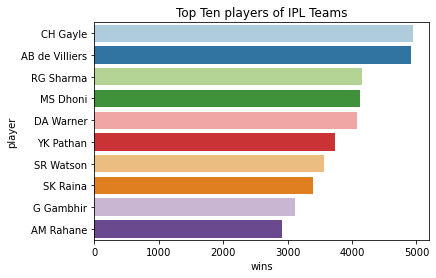

In [83]:
# Lets visualize the players plot
plt.title("Top Ten players of IPL Teams")
sns.barplot(x='wins', y='player', data=player_df, palette='Paired')

In [84]:
toss_wins = data['toss_winner'].value_counts()

toss_df = pd.DataFrame(columns=["team", "wins"])

for items in toss_wins.iteritems():
    temp_toss = pd.DataFrame({
        'team':[items[0]],
        'wins':[items[1]]
    })
    toss_df = toss_df.append(temp_toss, ignore_index=True) 

In [85]:
toss_df

,team,wins
0,Mumbai Indians,23536
1,Kolkata Knight Riders,21751
2,Chennai Super Kings,21328
3,Kings XI Punjab,19350
4,Royal Challengers Bangalore,18999
5,Rajasthan Royals,18924
6,Delhi Daredevils,18548
7,Sunrisers Hyderabad,10809
8,Deccan Chargers,10376
9,Pune Warriors,4798


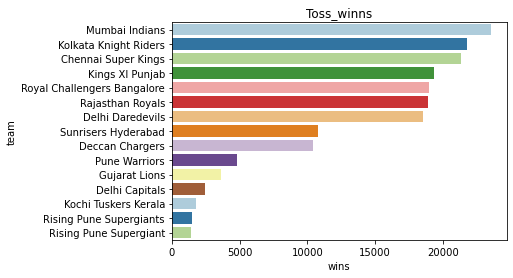

In [86]:
#Lets visualize the plot
plt.title("Toss_winns")
sns.barplot(x='wins', y='team', data=toss_df, palette='Paired');

In [87]:
runs_by_years = data.groupby(by='year').sum()['total_runs']
runs_by_years = pd.DataFrame(runs_by_years)
#runs_by_years.reset_index(inplace=True)
runs_by_years

,total_runs
year,
2008,17937
2009,16353
2010,18883
2011,21154
2012,22453
2013,22602
2014,18931
2015,18353
2016,18862


In [88]:
runs_by_years.reset_index(inplace=True)
runs_by_years

,year,total_runs
0,2008,17937
1,2009,16353
2,2010,18883
3,2011,21154
4,2012,22453
5,2013,22602
6,2014,18931
7,2015,18353
8,2016,18862
9,2017,18786


In [89]:
total_runs = go.Scatter(
                    x=runs_by_years['year'],
                    y=runs_by_years['total_runs'],
                    mode='lines',
                    name='runs')

data_new = [total_runs]

layout = go.Layout(title='Runs scored by year',
                  xaxis = dict(title='Year'),
                  yaxis = dict(title='Runs'))

fig = go.Figure(data=data_new, layout=layout)

pyo.iplot(fig)

In [90]:
runs_and_wickets_by_over = data.groupby(by='over').sum()
runs_and_wickets_by_over = pd.DataFrame(runs_and_wickets_by_over[['total_runs', 'win_by_wickets']])
runs_and_wickets_by_over.reset_index(inplace=True)
runs_and_wickets_by_over

,over,total_runs,win_by_wickets
0,1,9406,31923
1,2,10962,31975
2,3,12118,31743
3,4,12407,31543
4,5,12426,31274
5,6,12512,31179
6,7,10083,31180
7,8,10737,30955
8,9,11127,30877
9,10,10987,30638


In [91]:
runs_overs = data[['total_runs', 'over']]
runs_overs

,total_runs,over
0,0,1
1,0,1
2,4,1
3,0,1
4,2,1
...,...,...
179073,1,20
179074,2,20
179075,1,20
179076,2,20


In [92]:
runs_over = go.Box(
                    x=runs_overs['over'],
                    y=runs_overs['total_runs']
                )

data_new = [runs_over]

layout = go.Layout(title='Runs distribution over wise',
                  xaxis = dict(title='Over'),
                  yaxis = dict(title='Runs'))

fig = go.Figure(data=data_new, layout=layout)

pyo.iplot(fig)

In [93]:
runs_by_match = data.groupby(by='match_id').sum()
runs_by_match = pd.DataFrame(runs_by_match[['total_runs']])
runs_by_match.reset_index(inplace=True)
runs_by_match

,match_id,total_runs
0,1,379
1,2,371
2,3,367
3,4,327
4,5,299
...,...,...
751,11347,280
752,11412,276
753,11413,341
754,11414,317


In [94]:
runs_by_match = go.Histogram(
                    x=runs_by_match['total_runs']
                )

data_new = [runs_by_match]

layout = go.Layout(title='Runs distribution match wise',
                  xaxis = dict(title='Runs'))

fig = go.Figure(data=data_new, layout=layout)

pyo.iplot(fig)

In [96]:
#Runs by ball of the over
runs_by_ball_of_overs = data.groupby(by=['ball', 'over']).sum()
runs_by_ball_of_overs = pd.DataFrame(runs_by_ball_of_overs[['total_runs']])
runs_by_ball_of_overs.reset_index(inplace=True)
runs_by_ball_of_overs

,ball,over,total_runs
0,1,1,1184
1,1,2,1590
2,1,3,1903
3,1,4,1835
4,1,5,1883
...,...,...,...
175,9,16,0
176,9,17,9
177,9,18,11
178,9,19,24


In [97]:
runs_by_ball_of_over = go.Heatmap(
                    x=runs_by_ball_of_overs['over'],
                    y=runs_by_ball_of_overs['ball'],
                    z=runs_by_ball_of_overs['total_runs']
                )

data_new = [runs_by_ball_of_over]

layout = go.Layout(title='Runs distribution over and ball wise',
                  xaxis = dict(title='Over'),
                  yaxis = dict(title='Ball'))

fig = go.Figure(data=data_new, layout=layout)

pyo.iplot(fig)

In [98]:
batsmen = match[['match_id','season']].merge(df, left_on = 'match_id', right_on = 'match_id', how = 'left').drop('match_id', axis = 1)
season=batsmen.groupby(['season'])['total_runs'].sum().reset_index()

avgruns_each_season=match.groupby(['season']).count().match_id.reset_index()
avgruns_each_season.rename(columns={'match_id':'matches'},inplace=1)
avgruns_each_season['total_runs']=season['total_runs']
avgruns_each_season['average_runs_per_match']=avgruns_each_season['total_runs']/avgruns_each_season['matches']

In [99]:
Season_boundaries=batsmen.groupby("season")["batsman_runs"].agg(lambda x: (x==6).sum()).reset_index()
fours=batsmen.groupby("season")["batsman_runs"].agg(lambda x: (x==4).sum()).reset_index()
Season_boundaries=Season_boundaries.merge(fours,left_on='season',right_on='season',how='left')
Season_boundaries=Season_boundaries.rename(columns={'batsman_runs_x':'6"s','batsman_runs_y':'4"s'})

Season_boundaries['6"s'] = Season_boundaries['6"s']*6
Season_boundaries['4"s'] = Season_boundaries['4"s']*4
Season_boundaries['total_runs'] = season['total_runs']

trace1 = go.Bar(
    x=Season_boundaries['season'],
    y=Season_boundaries['total_runs']-(Season_boundaries['6"s']+Season_boundaries['4"s']),
    marker = dict(line=dict(color='#000000', width=1)),
    name='Remaining runs',opacity=0.6)

trace2 = go.Bar(
    x=Season_boundaries['season'],
    y=Season_boundaries['4"s'],
    marker = dict(line=dict(color='#000000', width=1)),
    name='Run by 4"s',opacity=0.7)

trace3 = go.Bar(
    x=Season_boundaries['season'],
    y=Season_boundaries['6"s'],
    marker = dict(line=dict(color='#000000', width=1)),
    name='Run by 6"s',opacity=0.7)


data = [trace1, trace2, trace3]
layout = go.Layout(title="Run Distribution per year",barmode='stack',xaxis = dict(tickmode='linear',title="Year"),
                                    yaxis = dict(title= "Run Distribution"), plot_bgcolor='rgb(245,245,245)')

fig = go.Figure(data=data, layout=layout)
iplot(fig)

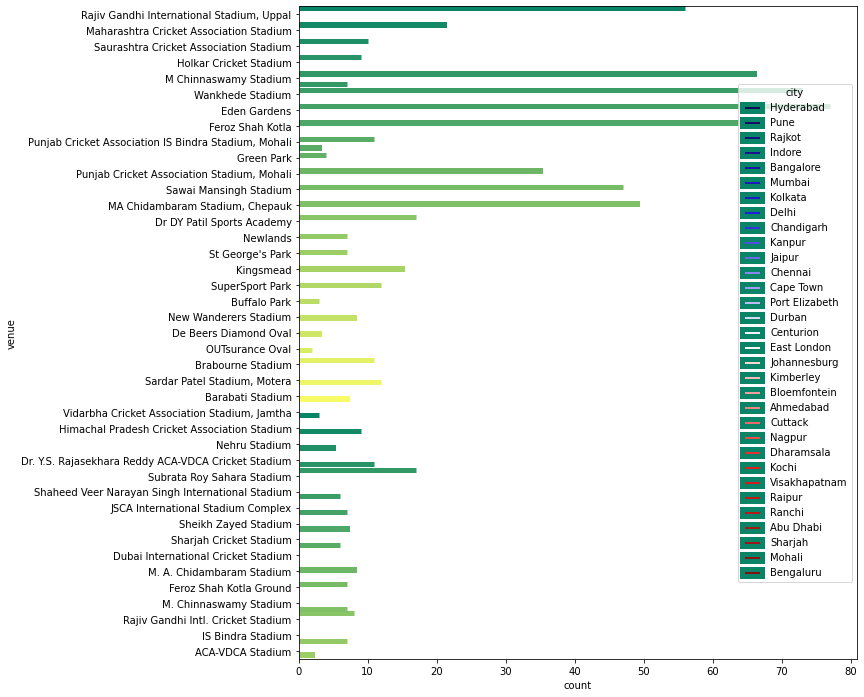

In [100]:
fig=plt.figure(figsize=(10,12))
plt.subplot(polar=False)
sns.countplot(y='venue',hue='city',data=match,palette='seismic',linewidth=5,edgecolor=sns.color_palette("summer",25))
#sns.factorplot(y='venue',hue='city',data=ipl_matches,palette='seismic',kind='count',size=8,aspect=1,linewidth=10)

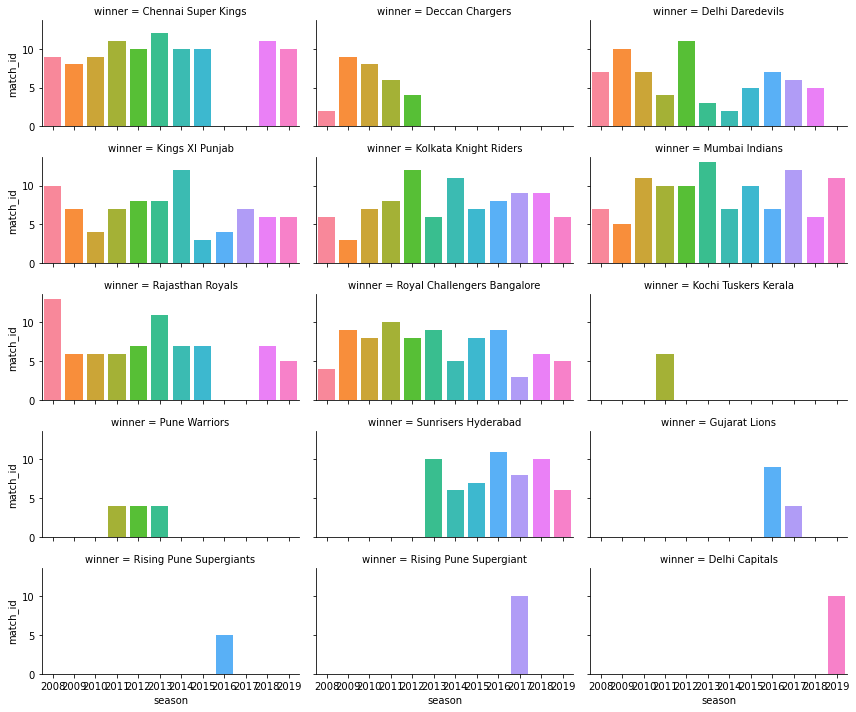

In [103]:

total_win=match.groupby(['season','winner']).count()[['match_id']].reset_index()
sns.factorplot(data=total_win,x='season',y='match_id',col='winner',col_wrap=3,size=2,kind='bar',aspect=2,saturation=2,
margin_titles=True)

In [104]:
#Maximum Wins:
ipl_win = match.groupby('season').tail(1).sort_values('season', ascending = True)
ipl_winners = ipl_win.winner.value_counts()
ipl_winners

Mumbai Indians           4
Chennai Super Kings      3
Kolkata Knight Riders    2
Sunrisers Hyderabad      1
Deccan Chargers          1
Rajasthan Royals         1
Name: winner, dtype: int64

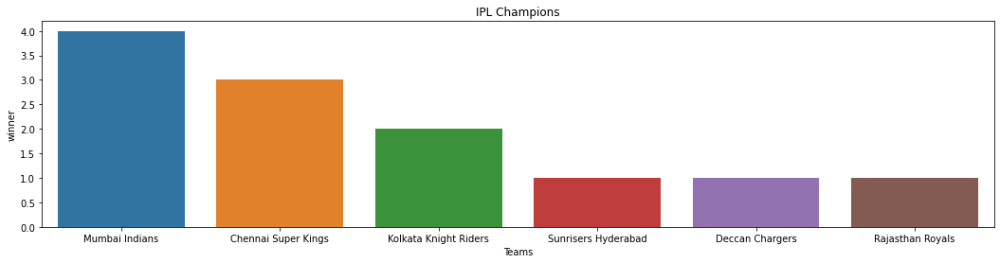

In [105]:
plt.figure(figsize=(18, 4))
plt.xlabel('Teams')
plt.ylabel('No. of Times')
plt.title('IPL Champions')
sns.barplot( x  = ipl_winners.index, y = ipl_winners);

In [106]:
matches_won_each_season = pd.crosstab(match['winner'], match['season'])
matches_won_each_season

season,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019
winner,,,,,,,,,,,,
Chennai Super Kings,9,8,9,11,10,12,10,10,0,0,11,10
Deccan Chargers,2,9,8,6,4,0,0,0,0,0,0,0
Delhi Capitals,0,0,0,0,0,0,0,0,0,0,0,10
Delhi Daredevils,7,10,7,4,11,3,2,5,7,6,5,0
Gujarat Lions,0,0,0,0,0,0,0,0,9,4,0,0
Kings XI Punjab,10,7,4,7,8,8,12,3,4,7,6,6
Kochi Tuskers Kerala,0,0,0,6,0,0,0,0,0,0,0,0
Kolkata Knight Riders,6,3,7,8,12,6,11,7,8,9,9,6
Mumbai Indians,7,5,11,10,10,13,7,10,7,12,6,11


## Inferences from the analysis:
The Chennai Super Kings have been the most consistent team, winning at least 8 matches in each of the seasons they have played.
We can observe that maximum number of matches were held at Eden Gardens.
Till now IPL match has been held at 40 venues
Mumbai Indians have played the most matches in the IPL
Chennai and Mumbai are the two teams with the highest win percentage
Mumbai Indians have the won the IPL 4 times, the most. They are followed by Chennai and Kolkata Knight Riders

# Conclusion:
    
This analysis was done using python and few codes of plotly. A very broad picture is covered in this notebook, however much 
more analysis can be actually done on individual seasonal performances of the matches along with their players.

Our suggestion would be for the three teams Mumbai Indians, Chennai super Kings and Kolkata Knight riders that a company
should approach for their product endorsement as these teams have proven to be heavy-weights in manintaining the consistency 
and have dominated the IPL series.
